# Background
- Found so many missing cells from JK025. Also could be in JK027 and JK030
- I found out about 'max_proj' at the end of the manual curation process (JK039 later sessions). This gives better confidence on the cell selection.

# Test
- Run cellpose using meanImage, meanImageE, and max_proj and combined them, and then filter by size
- Compare with manual curation
    - JK025-030 VS JK036-039
        - Manual curation assumption was different between these two groups.
    - Apply to JK052 and other non-learners as well.

In [156]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
from pprint import pprint
import os
from cellpose import models
from cellpose import io as cpio
from cellpose import plot
import tifffile
from skimage import exposure
import glob

base_dir_1 = Path('F:/')
base_dir_2 = Path('D:/')
mice = [25,27,30,36,39,52]
planes = range(1,9)

In [19]:
mouse = 25
session = 1
plane = 4
if mouse < 31:
    base_dir = base_dir_1
else:
    base_dir = base_dir_2
ops = np.load(f'{base_dir}{mouse:03}/plane_{plane}/{session:03d}/plane0/ops.npy', allow_pickle=True).item()

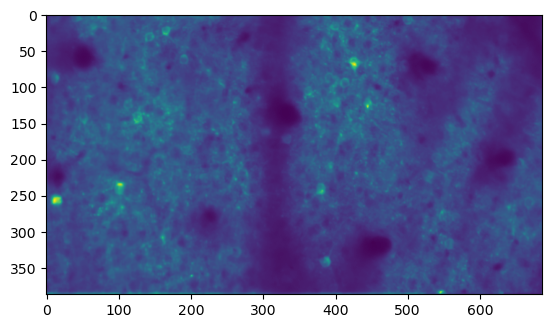

In [10]:
plt.imshow(ops['meanImg'])

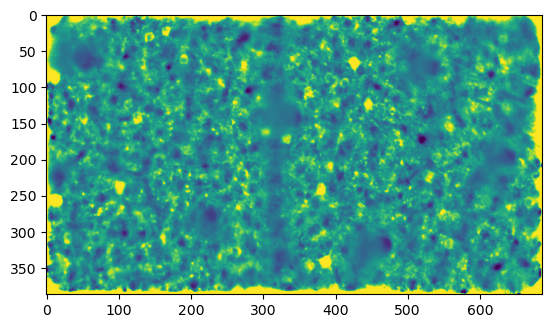

In [9]:
plt.imshow(ops['meanImgE'])

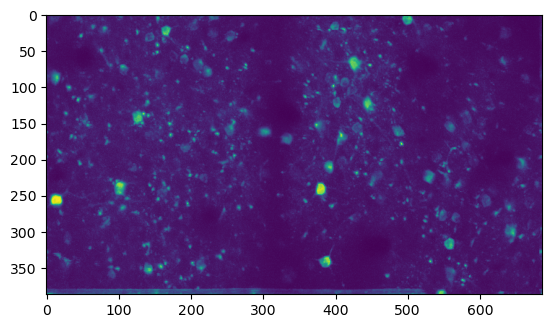

In [8]:
plt.imshow(ops['max_proj'])

In [11]:
model = models.CellposeModel(gpu=True, model_type='cyto')
channels = [0,0]
masks, flows, styles = model.eval(ops['meanImg'], channels=channels)

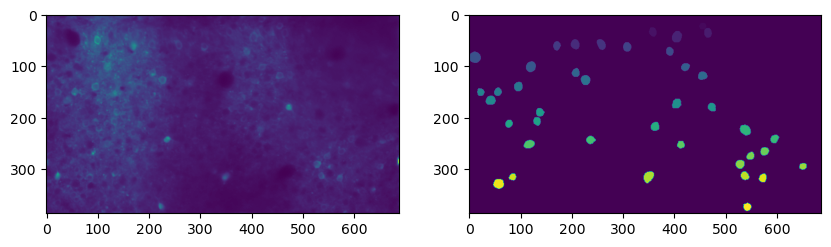

In [20]:
masks, flows, styles = model.eval(ops['meanImg'], channels=channels)
fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].imshow(ops['meanImg'])
ax[1].imshow(masks)

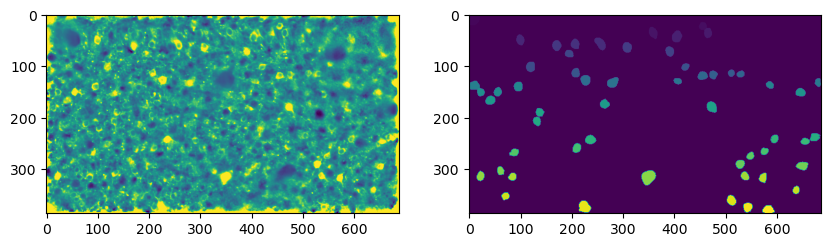

In [21]:
masks, flows, styles = model.eval(ops['meanImgE'], channels=channels)
fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].imshow(ops['meanImgE'])
ax[1].imshow(masks)

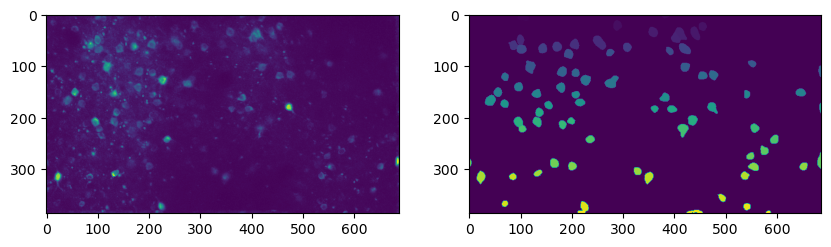

In [22]:
masks, flows, styles = model.eval(ops['max_proj'], channels=channels)
fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].imshow(ops['max_proj'])
ax[1].imshow(masks)

In [37]:
flows[2]

array([[-5.7126546 , -5.570109  , -5.577184  , ..., -0.23317431,
        -0.68884426, -1.7618052 ],
       [-4.7241373 , -4.822111  , -5.059466  , ...,  1.3588997 ,
         0.85456175, -0.2594537 ],
       [-4.8639183 , -5.1852393 , -5.6363497 , ...,  1.4041938 ,
         1.0930831 , -0.02574225],
       ...,
       [-4.916128  , -5.3237677 , -5.6763787 , ..., -1.5475215 ,
        -1.1542792 , -1.5874851 ],
       [-4.834053  , -5.0226026 , -5.381044  , ..., -0.862401  ,
        -0.7869544 , -1.7762989 ],
       [-5.618906  , -5.359142  , -5.2505145 , ..., -1.3498719 ,
        -1.306035  , -2.7965386 ]], dtype=float32)

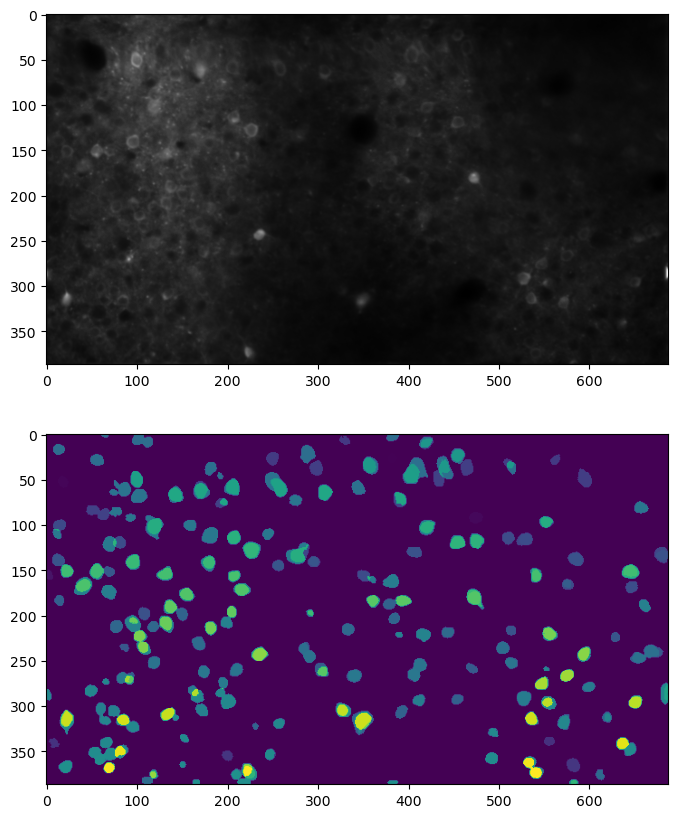

In [61]:
# Joint map of those three masks
diameter = 13
mean_mask = model.eval(ops['meanImg'], channels=channels, diameter=diameter)[0]
meanE_mask = model.eval(ops['meanImgE'], channels=channels, diameter=diameter)[0]
meanE_mask[meanE_mask>0] += np.max(mean_mask)
max_mask = model.eval(ops['max_proj'], channels=channels, diameter=diameter)[0]
max_mask[max_mask>0] += np.max(meanE_mask)

joint_mask = mean_mask + meanE_mask + max_mask

fig, ax = plt.subplots(2, 1, figsize=(10, 10))
ax[0].imshow(ops['meanImg'], cmap='gray')
ax[1].imshow(joint_mask)


In [50]:
stat = np.load(f'{base_dir}{mouse:03}/plane_{plane}/{session:03d}/plane0/stat.npy', allow_pickle=True)
iscell = np.load(f'{base_dir}{mouse:03}/plane_{plane}/{session:03d}/plane0/iscell.npy')
cell_inds = np.where(iscell[:,0])[0]

In [54]:
stat[0].keys()

dict_keys(['ypix', 'xpix', 'lam', 'footprint', 'mrs', 'mrs0', 'compact', 'med', 'npix', 'overlap', 'radius', 'aspect_ratio', 'npix_norm', 'skew', 'std'])

In [56]:
cell_radii_calc = [np.sqrt(s['npix']/np.pi) for s in stat[cell_inds]]
np.mean(cell_radii_calc)

7.380448797657891

In [60]:
cell_radii = [s['radius'] for s in stat[cell_inds]]
np.percentile(cell_radii,2)

6.433519340675364

In [69]:
min_radius = np.min(cell_radii)*0.7
min_pixel = np.pi*min_radius**2
min_pixel

49.157709844381216

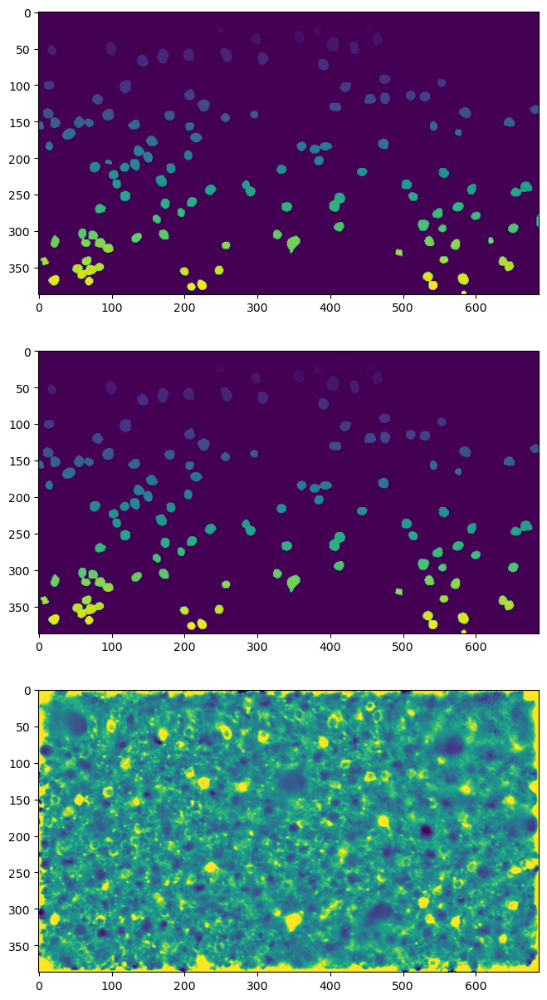

In [68]:
mean_mask_filtered = mean_mask.copy()
for i in range(1, np.max(mean_mask)):
    if np.sum(mean_mask == i) < min_pixel:
        mean_mask_filtered[mean_mask == i] = 0

fig, ax = plt.subplots(3,1, figsize=(10,15))
ax[0].imshow(mean_mask)
ax[1].imshow(mean_mask_filtered)
ax[2].imshow(ops['meanImgE'])

# Looks promising
- Joint map of those from meanImg, meanImgE, and max_proj


# Left works
- Decide diameter (without it it loses a lot of cells, and the result depends a lot on the diameter)
- Dendrite size filtering
    - Do this first, and then grid search optimal 'diameter' by comparing # of ROIs after filtering
- How to deal with overlaps
    - Multiple types of overlaps
        - (Near-)complete inclusion
        - Partial overlap - what to do with the remaining?
        - Fused cells and inclusion
- Decide from some examples, and then apply to the same pixel resolution images

## There are many merged ROIs
- See if it depends on the 'diameter' parameter


In [126]:
def get_cp_masks(ops, images=None, model_type='cyto', diameter=13, channels=[0,0], clahe=False):

    model = models.CellposeModel(gpu=True, model_type=model_type)
    
    if images is None:
        mean_img = ops['meanImg']
        meanE_img = ops['meanImgE']
        max_img = ops['max_proj']
        if clahe:
            mean_img = apply_clahe(mean_img)
            max_img = apply_clahe(max_img)
        mean_mask = model.eval(mean_img, channels=channels, diameter=diameter)[0]
        mean_mask[mean_mask>0] += 10
        meanE_mask = model.eval(meanE_img, channels=channels, diameter=diameter)[0]
        meanE_mask[meanE_mask>0] += np.max(mean_mask) + 10
        max_mask = model.eval(max_img, channels=channels, diameter=diameter)[0]
        max_mask[max_mask>0] += np.max(meanE_mask) + 10

        return mean_mask, meanE_mask, max_mask
    else:
        if images == 'mean':
            img = ops['meanImg']
        elif images == 'meanE':
            img = ops['meanImgE']
        elif images == 'max':
            img = ops['max_proj']
        if clahe:
            if images != 'meanE':
                img = apply_clahe(img)
        mask = model.eval(img, channels=channels, diameter=diameter)[0]
        mask[mask>0] += 10
        return mask

def apply_clahe(img):
    img_norm = (img - np.min(img)) / (np.max(img) - np.min(img))
    img_clahe = exposure.equalize_adapthist(img_norm)
    return img_clahe

100%|██████████| 25.3M/25.3M [00:02<00:00, 9.66MB/s]


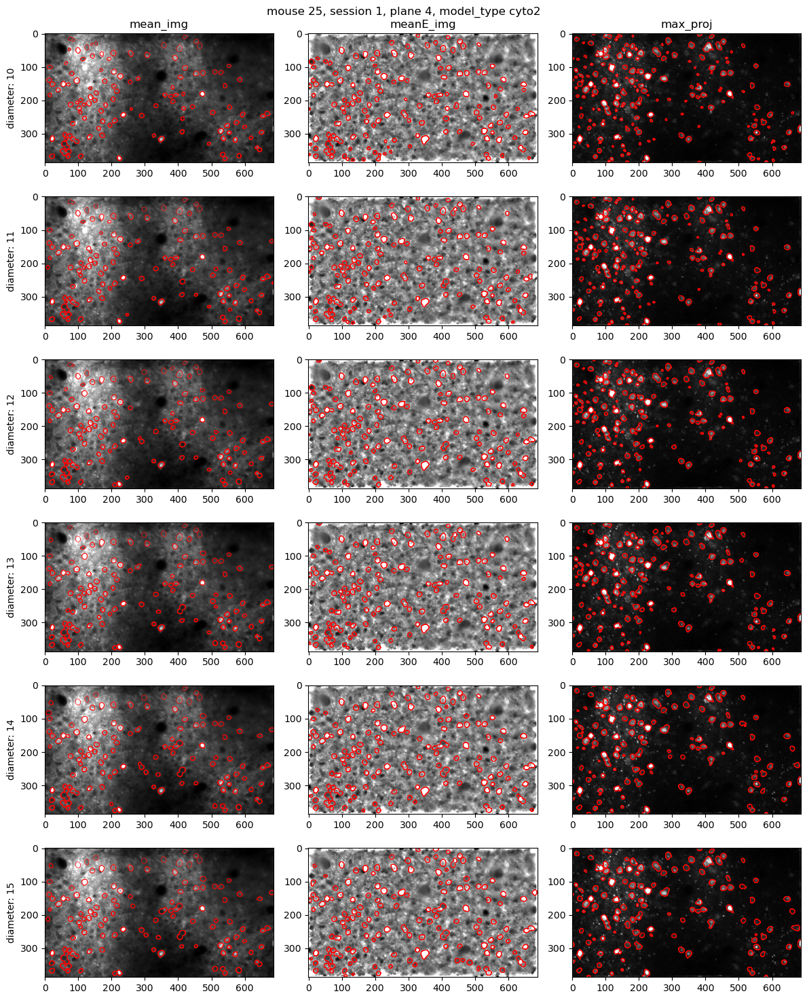

In [119]:
mouse = 25
session = 1
plane = 4
ops = np.load(f'{base_dir}{mouse:03}/plane_{plane}/{session:03d}/plane0/ops.npy', allow_pickle=True).item()

mean_img = np.clip(ops['meanImg'], np.percentile(ops['meanImg'], 0.5), np.percentile(ops['meanImg'], 99.5))
meanE_img = ops['meanImgE']
max_img = np.clip(ops['max_proj'], np.percentile(ops['max_proj'], 0.5), np.percentile(ops['max_proj'], 99.5))

diameter_list = np.arange(10, 16)
fig, ax = plt.subplots(len(diameter_list), 3, figsize=(12, len(diameter_list)*2.5))
model_type = 'cyto2'
for i in range(len(diameter_list)):
    diameter = diameter_list[i]
    mean_mask, meanE_mask, max_mask = get_cp_masks(ops, diameter=diameter, model_type=model_type)
    ax[i, 0].imshow(mean_img, cmap='gray')
    ax[i, 0].contour(mean_mask, colors='r', linewidths=0.5)
    ax[i, 1].imshow(meanE_img, cmap='gray')
    ax[i, 1].contour(meanE_mask, colors='r', linewidths=0.5)
    ax[i, 2].imshow(max_img, cmap='gray')
    ax[i, 2].contour(max_mask, colors='r', linewidths=0.5)
    ax[i, 0].set_ylabel(f'diameter: {diameter}')
ax[0, 0].set_title('mean_img')
ax[0, 1].set_title('meanE_img')
ax[0, 2].set_title('max_proj')
fig.suptitle(f'mouse {mouse}, session {session}, plane {plane}, model_type {model_type}')
fig.tight_layout()


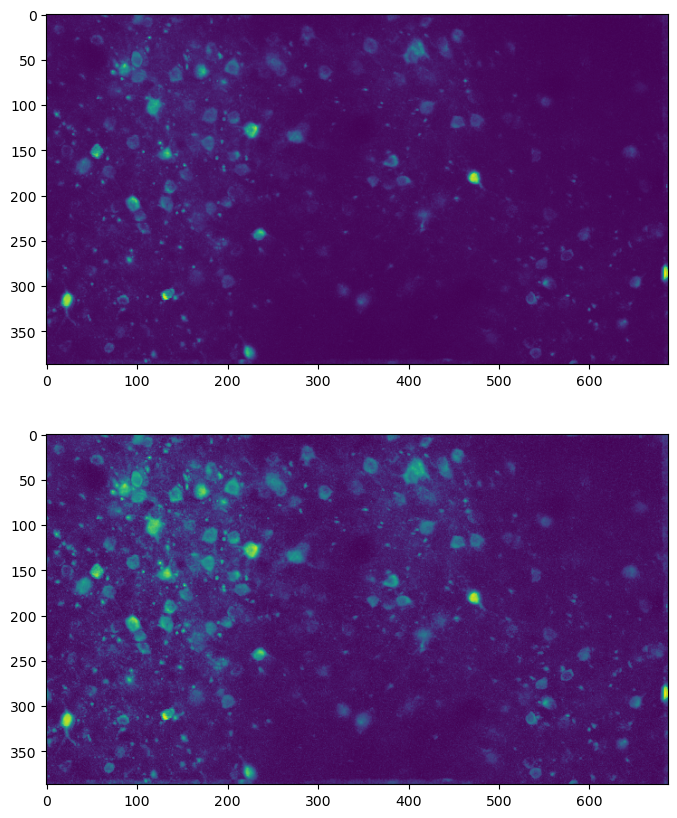

In [109]:
# CLAHE 
from skimage import exposure
max_proj = ops['max_proj']
max_proj_clahe = (max_proj - np.min(max_proj)) / (np.max(max_proj) - np.min(max_proj))
max_proj_clahe = exposure.equalize_adapthist(max_proj_clahe)
fig, ax = plt.subplots(2,1, figsize=(10,10))
ax[0].imshow(max_proj)
ax[1].imshow(max_proj_clahe)

### Run cyto, cyto2, and CP on clahe images


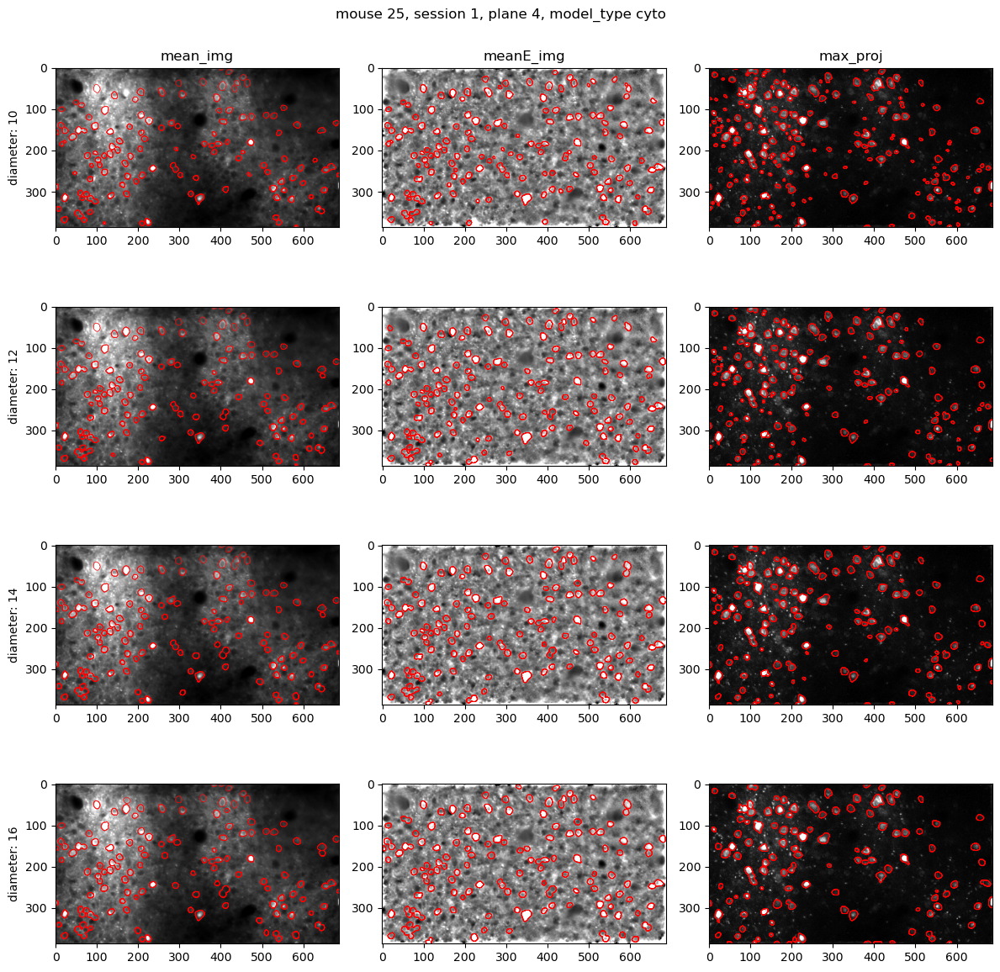

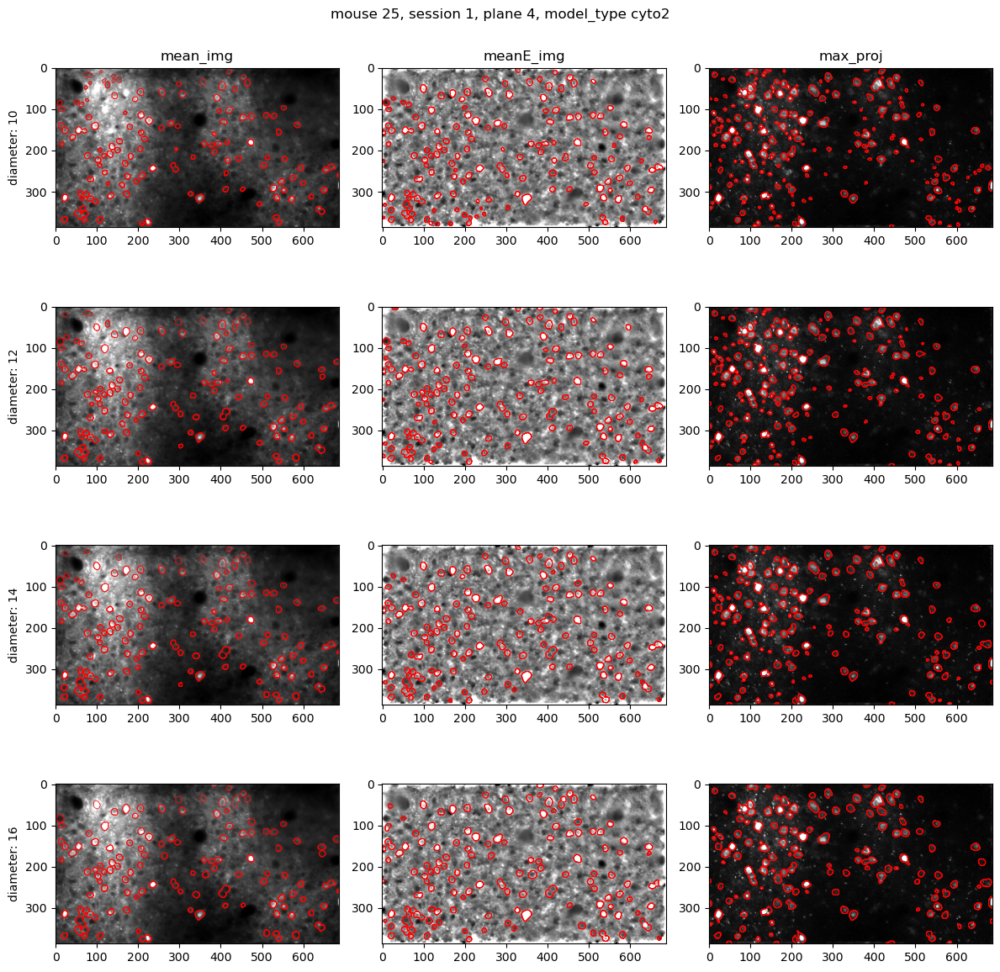

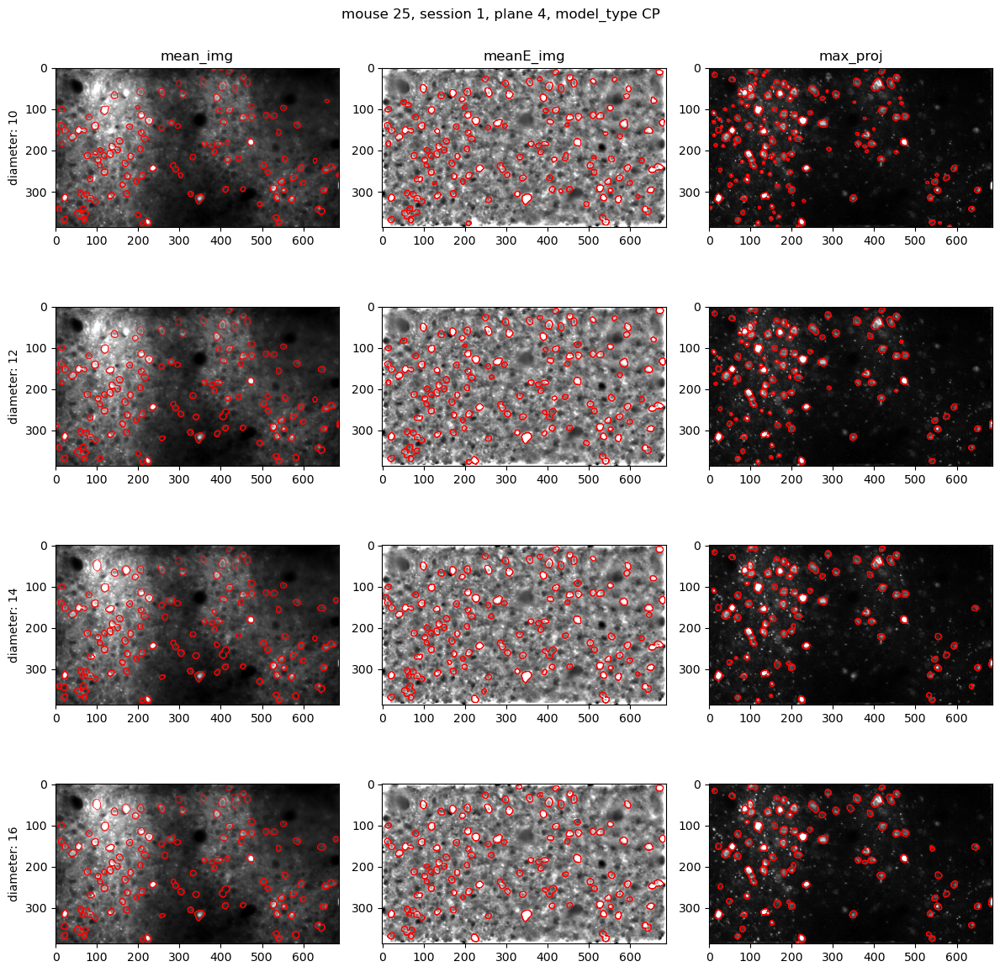

In [125]:
mouse = 25
session = 1
plane = 4
ops = np.load(f'{base_dir}{mouse:03}/plane_{plane}/{session:03d}/plane0/ops.npy', allow_pickle=True).item()

diameter_list = np.arange(10, 17, 2)

model_type_list = ['cyto', 'cyto2', 'CP']
for model_type in model_type_list:
    fig, ax = plt.subplots(len(diameter_list), 3, figsize=(12, len(diameter_list)*3))
    for i in range(len(diameter_list)):
        diameter = diameter_list[i]
        mean_mask, meanE_mask, max_mask = get_cp_masks(ops, diameter=diameter, model_type=model_type, clahe=True)
        ax[i, 0].imshow(mean_img, cmap='gray')
        ax[i, 0].contour(mean_mask, colors='r', linewidths=0.5)
        ax[i, 1].imshow(meanE_img, cmap='gray')
        ax[i, 1].contour(meanE_mask, colors='r', linewidths=0.5)
        ax[i, 2].imshow(max_img, cmap='gray')
        ax[i, 2].contour(max_mask, colors='r', linewidths=0.5)
        ax[i, 0].set_ylabel(f'diameter: {diameter}')
    ax[0, 0].set_title('mean_img')
    ax[0, 1].set_title('meanE_img')
    ax[0, 2].set_title('max_proj')
    fig.suptitle(f'mouse {mouse}, session {session}, plane {plane}, model_type {model_type}')
    fig.tight_layout()

In [ ]:
mean_mask, meanE_mask, max_mask = get_cp_masks(ops, diameter=diameter, model_type=model_type)

## Possible solutions for merging
- Erosion-dilation
- CLAHE
    - This could also help getting more cells from max_proj

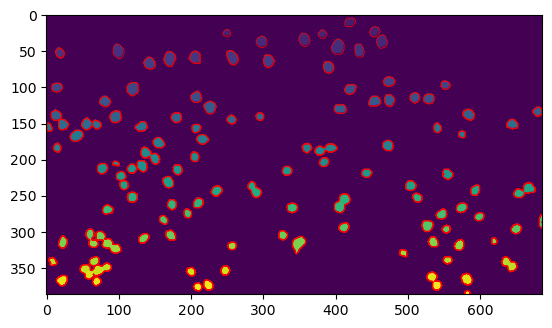

In [129]:
# take an example from mean_image
mouse = 25
session = 1
plane = 4
ops = np.load(f'{base_dir}{mouse:03}/plane_{plane}/{session:03d}/plane0/ops.npy', allow_pickle=True).item()

mask = get_cp_masks(ops, images='mean', diameter=13)
fig, ax = plt.subplots()
ax.imshow(mask)
ax.contour(mask, colors='r', linewidths=0.5)

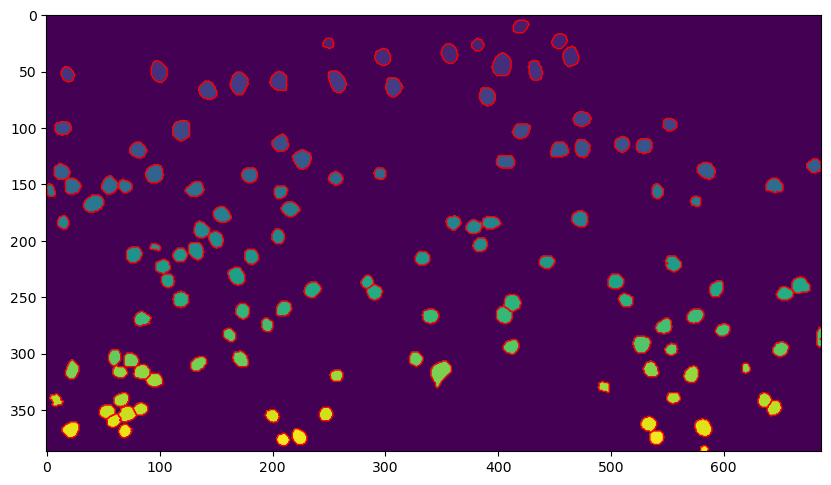

In [147]:
mask_inds = np.setdiff1d(np.unique(mask),0)
fig, ax = plt.subplots(1,1,figsize=(10,10))
ax.imshow(mask)
for maski in mask_inds:
    ax.contour(mask==maski, colors='r', linewidths=1)


## First, decide dendrite size filtering threshold.
- Based on pixel resolution
- 3 um diameter?

In [82]:
dendrite_threshold = 7  # in microns
if mouse < 31:
    pix_size = 0.7  # in microns
else:
    pix_size = 0.82  # in microns

filtering_pixel = (dendrite_threshold / pix_size / 2) ** 2 * np.pi
print(f'filtering_pixel: {filtering_pixel}')

filtering_pixel: 78.53981633974483


(array([1., 0., 0., 0., 1., 0., 0., 1., 0., 1., 2., 0., 0., 1., 0., 0., 0.,
        0., 1., 0., 2., 1., 1., 1., 3., 1., 1., 2., 0., 5., 3., 1., 1., 2.,
        6., 1., 3., 1., 2., 4., 0., 5., 1., 8., 2., 4., 0., 8., 3., 3., 1.,
        2., 9., 3., 0., 2., 4., 1., 1., 1., 1., 2., 1., 1., 0., 2., 2., 1.,
        0., 1., 1., 0., 0., 3., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0.,
        0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 2.]),
 array([ 43.  ,  45.23,  47.46,  49.69,  51.92,  54.15,  56.38,  58.61,
         60.84,  63.07,  65.3 ,  67.53,  69.76,  71.99,  74.22,  76.45,
         78.68,  80.91,  83.14,  85.37,  87.6 ,  89.83,  92.06,  94.29,
         96.52,  98.75, 100.98, 103.21, 105.44, 107.67, 109.9 , 112.13,
        114.36, 116.59, 118.82, 121.05, 123.28, 125.51, 127.74, 129.97,
        132.2 , 134.43, 136.66, 138.89, 141.12, 143.35, 145.58, 147.81,
        150.04, 152.27, 154.5 , 156.73, 158.96, 161.19, 163.42, 165.65,
        167.88, 170.11, 172.34, 174.57, 176.8 

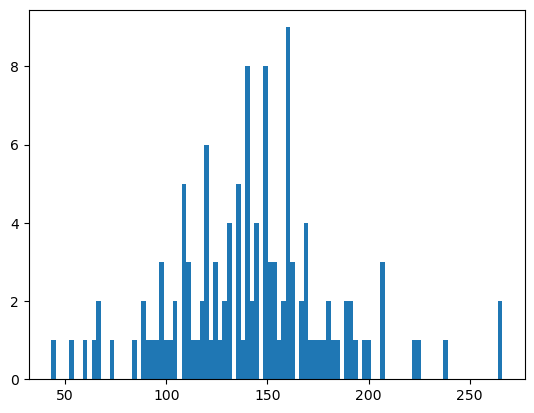

In [80]:
pix_sizes = []
for i in range(1, np.max(mean_mask)):
    pix_sizes.append(np.sum(mean_mask==i))
plt.hist(pix_sizes, bins=100)

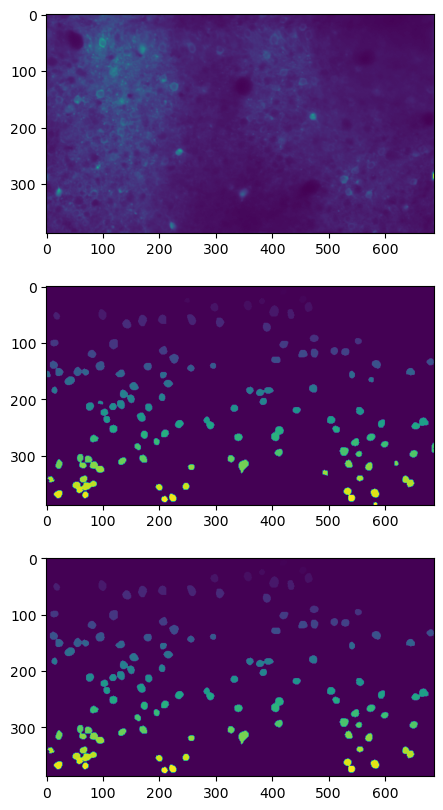

In [91]:
mean_mask_filtered = mean_mask.copy()
for i in range(1, np.max(mean_mask)+1):
    if np.sum(mean_mask == i) < filtering_pixel:
        mean_mask_filtered[mean_mask == i] = 0

fig, ax = plt.subplots(3,1, figsize=(5,10))
ax[0].imshow(ops['meanImg'])
ax[1].imshow(mean_mask)
ax[2].imshow(mean_mask_filtered)

In [150]:
# Looks like 7 is the magic number
# Test across different protocols, mice, and planes

mouse = 25
session = 1
plane = 4
if mouse < 31:
    base_dir = base_dir_1
else:
    base_dir = base_dir_2
ops = np.load(f'{base_dir}{mouse:03}/plane_{plane}/{session:03d}/plane0/ops.npy', allow_pickle=True).item()
mean_mask, meanE_mask, max_mask = get_cp_masks(ops)


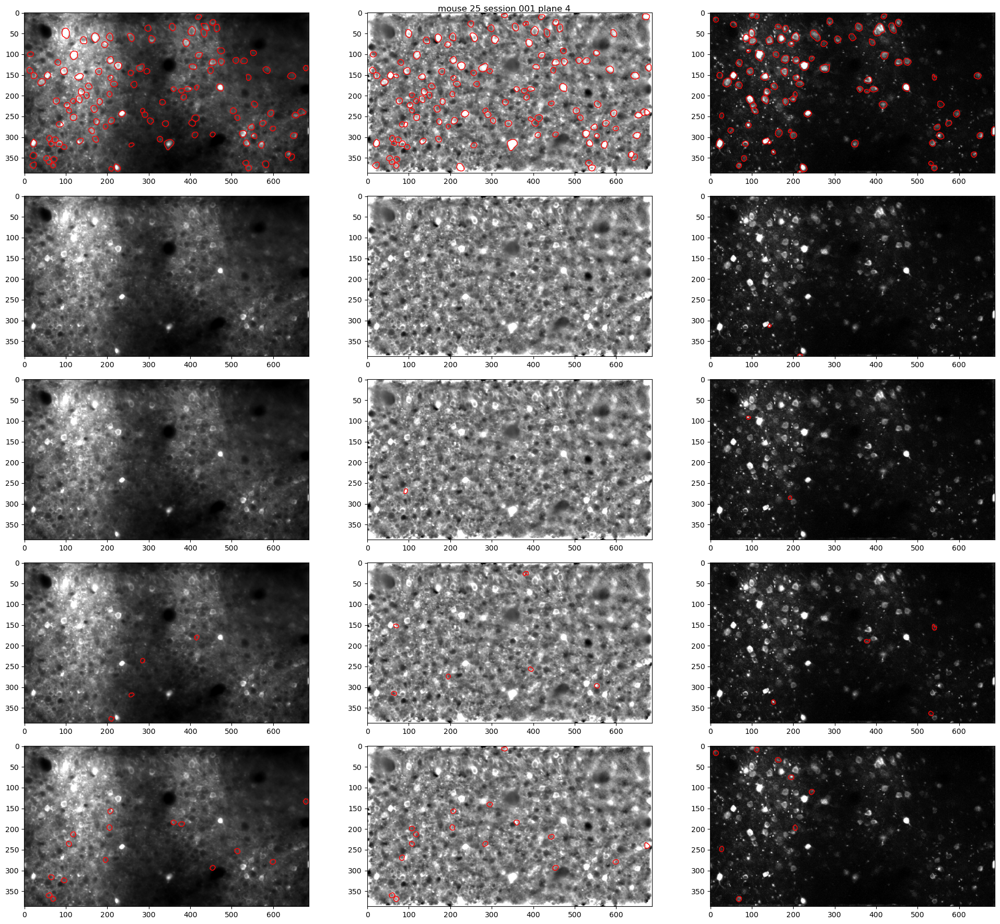

In [149]:
def get_filtered_mask(mask, mouse, dendrite_threshold):
    if mouse < 31:
        pix_size = 0.7  # in microns
    else:
        pix_size = 0.82  # in microns

    filtering_pixel = (dendrite_threshold / pix_size / 2) ** 2 * np.pi

    mask_filtered = mask.copy()
    roi_nums = np.setdiff1d(np.unique(mask),0)
    for i in roi_nums:
        if np.sum(mask == i) < filtering_pixel:
            mask_filtered[mask == i] = 0
    return mask_filtered

def draw_contours(ax, mask, img=None, colors='r', linewidths=1):
    if img is None:
        img = mask > 0
    ax.imshow(img, cmap='gray')
    mask_inds = np.setdiff1d(np.unique(mask), 0)
    for i in mask_inds:
        temp_mask = mask == i
        ax.contour(temp_mask, colors=colors, linewidths=linewidths)


thresholds = np.arange(5,10)
fig, ax = plt.subplots(len(thresholds), 3, figsize=(len(thresholds)*4,18))
mean_img = np.clip(ops['meanImg'], np.percentile(ops['meanImg'], 0.5), np.percentile(ops['meanImg'], 99.5))
meanE_img = ops['meanImgE']
max_img = np.clip(ops['max_proj'], np.percentile(ops['max_proj'], 0.5), np.percentile(ops['max_proj'], 99.5))
prev_mean_mask_filtered = np.zeros_like(mean_mask)
prev_meanE_mask_filtered = np.zeros_like(meanE_mask)
prev_max_mask_filtered = np.zeros_like(max_mask)
for thresh in range(5,10):
    mean_mask_filtered = get_filtered_mask(mean_mask, mouse, thresh)
    if prev_mean_mask_filtered.sum() == 0:
        temp_mask = mean_mask_filtered.copy()
        prev_mean_mask_filtered = mean_mask_filtered.copy()
    else:
        temp_mask = prev_mean_mask_filtered - mean_mask_filtered
        prev_mean_mask_filtered = mean_mask_filtered.copy()
    ax[thresh-5,0].imshow(mean_img, cmap='gray')
    draw_contours(ax[thresh-5,0], temp_mask, mean_img)

    meanE_mask_filtered = get_filtered_mask(meanE_mask, mouse, thresh)
    if prev_meanE_mask_filtered.sum() == 0:
        temp_mask = meanE_mask_filtered.copy()
        prev_meanE_mask_filtered = meanE_mask_filtered.copy()
    else:
        temp_mask = prev_meanE_mask_filtered - meanE_mask_filtered
        prev_meanE_mask_filtered = meanE_mask_filtered.copy()
    ax[thresh-5,1].imshow(meanE_img, cmap='gray')
    draw_contours(ax[thresh-5,1], temp_mask, meanE_img)

    max_mask_filtered = get_filtered_mask(max_mask, mouse, thresh)
    if prev_max_mask_filtered.sum() == 0:
        temp_mask = max_mask_filtered.copy()
        prev_max_mask_filtered = max_mask_filtered.copy()
    else:
        temp_mask = prev_max_mask_filtered - max_mask_filtered
        prev_max_mask_filtered = max_mask_filtered.copy()
    ax[thresh-5,2].imshow(max_img, cmap='gray')
    draw_contours(ax[thresh-5,2], temp_mask, max_img)
fig.suptitle(f'mouse {mouse} session {session:03d} plane {plane}')
fig.tight_layout()


In [173]:
def save_dendritic_filtering_images(ops, mean_mask, meanE_mask, max_mask, mouse, session, plane, save_dir):
    thresholds = np.arange(4,10)
    min_thresh = np.min(thresholds)
    fig, ax = plt.subplots(len(thresholds), 4, figsize=(len(thresholds)*4,18))
    mean_img = np.clip(ops['meanImg'], np.percentile(ops['meanImg'], 0.5), np.percentile(ops['meanImg'], 99.5))
    meanE_img = ops['meanImgE']
    max_img = np.clip(ops['max_proj'], np.percentile(ops['max_proj'], 0.5), np.percentile(ops['max_proj'], 99.5))
    prev_mean_mask_filtered = np.zeros_like(mean_mask)
    prev_meanE_mask_filtered = np.zeros_like(meanE_mask)
    prev_max_mask_filtered = np.zeros_like(max_mask)
    for thresh in thresholds:
        mean_mask_filtered = get_filtered_mask(mean_mask, mouse, thresh)
        if prev_mean_mask_filtered.sum() == 0:
            temp_mask = mean_mask_filtered.copy()
            prev_mean_mask_filtered = mean_mask_filtered.copy()
        else:
            temp_mask = prev_mean_mask_filtered - mean_mask_filtered
            prev_mean_mask_filtered = mean_mask_filtered.copy()
        ax[thresh-min_thresh,0].imshow(mean_img, cmap='gray')
        draw_contours(ax[thresh-min_thresh,0], temp_mask, mean_img)
        ax[thresh-min_thresh,0].set_ylabel(f'thresh: {thresh}')

        ax[thresh-min_thresh,3].imshow(mean_img, cmap='gray')

        meanE_mask_filtered = get_filtered_mask(meanE_mask, mouse, thresh)
        if prev_meanE_mask_filtered.sum() == 0:
            temp_mask = meanE_mask_filtered.copy()
            prev_meanE_mask_filtered = meanE_mask_filtered.copy()
        else:
            temp_mask = prev_meanE_mask_filtered - meanE_mask_filtered
            prev_meanE_mask_filtered = meanE_mask_filtered.copy()
        ax[thresh-min_thresh,1].imshow(meanE_img, cmap='gray')
        draw_contours(ax[thresh-min_thresh,1], temp_mask, meanE_img)
        ax[thresh-min_thresh,1].set_ylabel(f'thresh: {thresh}')

        max_mask_filtered = get_filtered_mask(max_mask, mouse, thresh)
        if prev_max_mask_filtered.sum() == 0:
            temp_mask = max_mask_filtered.copy()
            prev_max_mask_filtered = max_mask_filtered.copy()
        else:
            temp_mask = prev_max_mask_filtered - max_mask_filtered
            prev_max_mask_filtered = max_mask_filtered.copy()
        ax[thresh-min_thresh,2].imshow(max_img, cmap='gray')
        draw_contours(ax[thresh-min_thresh,2], temp_mask, max_img)
        ax[thresh-min_thresh,2].set_ylabel(f'thresh: {thresh}')


    fig.suptitle(f'mouse {mouse} session {session:03d} plane {plane}')
    fig.tight_layout()

    fn = f'JK{mouse:03d}_S{session:03d}_plane{plane:03d}_dendritic_filtering.png'
    fig.savefig(os.path.join(save_dir, fn), dpi=300)
    plt.close(fig)



In [172]:
print(base_dir_2)

D:\


In [175]:
fig_save_dir = Path(r'C:\Users\shires\Dropbox\Works\Projects\2020 Neural stretching in S1\Analysis\cellpose_dendrite_filtering')
planes = np.arange(1,9)
sessions_to_test = [1,15]
for mouse in mice:
# for mouse in [52]:
    if mouse < 31:
        base_dir = base_dir_1
    else:
        base_dir = base_dir_2
    for session in sessions_to_test:
        for plane in planes:
            ops = np.load(f'{base_dir}{mouse:03}/plane_{plane}/{session:03d}/plane0/ops.npy', allow_pickle=True).item()
            mean_mask, meanE_mask, max_mask = get_cp_masks(ops)
            save_dendritic_filtering_images(ops, mean_mask, meanE_mask, max_mask, mouse, session, plane, fig_save_dir)



# Dendrite filtering
- 5 um diameter for meanImg and meanImgE
- 6 um diameter for max_proj

# Collecting ROIs across diameters and images
- Diameters to test 
    - 10 to 17 (pix) for JK025
    - 8 to 15 (pix)
- After filtering dendrites
- When collating, if there is overlap > 0.7 IoU, take the larger one.
    - Check the threshold
    - Allow overlap for signal extraction